In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install rasterio
!pip install geopandas
!pip install rasterstats
!pip install scipy
!pip install googletrans==4.0.0-rc1
!pip install mapclassify==2.5.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 112.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 108.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 4.6 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17396 sha256=58fd3a65773cf740778b7772530a4b1bb38882d548bb0bc84bfbf9dd289b8722
  Stored 

In [ ]:
import rasterio
import geopandas as gpd
from rasterstats import zonal_stats
from rasterio.mask import mask
import pandas as pd
from shapely.geometry import mapping
import numpy as np

Shade data integration

In [ ]:
# data input
gpkg_data = gpd.read_file("/content/drive/My Drive/Q1_20230126_ingekort.gpkg") #detail publich space input
raster_data = rasterio.open("/content/drive/My Drive/amsterdam_20230621_900.TIF") #shade map input
vector_data = gpd.read_file("/content/drive/My Drive/Amsneighborhood_2023/ams_buurten_2023.shp") #neighborhood input

# 'Gebruiksfunctie' unique value
unique_types = gpkg_data['Gebruiksfunctie'].unique()

# DataFrame for saving results
stats_dfs = []

# Loop through each unique value
for gebruiksfunctie in unique_types:
    filtered_data = gpkg_data[gpkg_data['Gebruiksfunctie'] == gebruiksfunctie]
    # Check if filtered_data is empty
    if filtered_data.empty:
        print(f"No data found for Gebruiksfunctie: {gebruiksfunctie}, skipping...")
        continue  # Skip to the next iteration

    # Merge polygons
    if len(filtered_data) > 1:
        combined_geom = filtered_data.unary_union # Use unary_union for combining geometries
    else:
        combined_geom = filtered_data.geometry.iloc[0]

    # Perform clipping
    out_image, out_transform = mask(raster_data, [mapping(combined_geom)], crop=True, nodata=0)

    # Reshape out_image to 2D if it has more than 2 dimensions
    if out_image.ndim > 2:
        out_image = out_image[0]  # Assuming the first band contains the relevant data

    # Zonal_stats
    stats = zonal_stats(vector_data, out_image, affine=out_transform, stats=['mean', 'sum'])
    stats_df = pd.DataFrame(stats)
    stats_df.columns = [f'{gebruiksfunctie}_mean', f'{gebruiksfunctie}_sum']
    stats_dfs.append(stats_df)

# merge all results to DataFrame
all_stats_df = pd.concat(stats_dfs, axis=1)

# add restuls to vector_data
vector_data = pd.concat([vector_data, all_stats_df], axis=1)

# Zonal_stats for each neighborhood
total_stats = zonal_stats(vector_data, raster_data.name, stats=['mean', 'sum'])
total_stats_df = pd.DataFrame(total_stats)
total_stats_df.columns = ['total_mean', 'total_sum']

# add total_stats_df to vector_data
vector_data = pd.concat([vector_data, total_stats_df], axis=1)

# output data
vector_data[['Code', 'total_sum', 'total_mean'] + list(all_stats_df.columns)].to_csv(
    "/content/drive/My Drive/ams_neighborhood_sun_900.csv", index=False
)

Convert data from sun to shade

In [ ]:
# Get the resolution information of the raster data
resolution = raster_data.res
# Calculate the pixel area
pixel_area = resolution[0] * resolution[1]

# Print the resolution information
print(f"The resolution of the raster data is: {resolution}")

In [ ]:
# read data
gpkg_data = gpd.read_file("/content/drive/My Drive/Q1_20230126_ingekort.gpkg")
raster_data = rasterio.open("/content/drive/My Drive/amsterdam_20230621_1000.TIF")
vector_data = gpd.read_file("/content/drive/My Drive/Amsneighborhood_2023/ams_buurten_2023.shp")

# 'Gebruiksfunctie' unique value
unique_types = gpkg_data['Gebruiksfunctie'].unique()

stats_df = pd.DataFrame(index=vector_data.index)
stats_df['Code'] = vector_data['Code']
stats_df['total_count'] = 0

# DataFrame for saving results
for gebruiksfunctie in unique_types:
    filtered_data = gpkg_data[gpkg_data['Gebruiksfunctie'] == gebruiksfunctie]
    # Check if filtered_data is empty
    if filtered_data.empty:
        print(f"No data found for Gebruiksfunctie: {gebruiksfunctie}, skipping...")
        continue  # Skip to the next iteration

    stats_df[f'{gebruiksfunctie}_count'] = 0

    # Loop through each area in vector_data
    for index, row in vector_data.iterrows():
        # Get the geometry of the current area
        geom = row.geometry

        # Calculate the total area of the current area
        total_area = geom.area
        stats_df.loc[index, 'total_count'] = total_area / pixel_area

        # Clip filtered_data to the current area
        clipped_data = filtered_data[filtered_data.geometry.intersects(geom)]

        # Calculate the total area of the current type in the current area
        type_area = clipped_data.geometry.area.sum()
        stats_df.loc[index, f'{gebruiksfunctie}_count'] = type_area / pixel_area

# output data
stats_df.to_csv("/content/drive/My Drive/area_counts.csv", index=False)

<ipython-input-8-5e6be47ef4c3>:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '96509.62770119759' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, 'total_count'] = total_area / pixel_area
<ipython-input-8-5e6be47ef4c3>:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '14352.15943609869' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, f'{gebruiksfunctie}_count'] = type_area / pixel_area
<ipython-input-8-5e6be47ef4c3>:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1231.6983984305566' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, f'{gebruiksfunctie}_count'] =

No data found for Gebruiksfunctie: None, skipping...


<ipython-input-8-5e6be47ef4c3>:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '12137.39941400241' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, f'{gebruiksfunctie}_count'] = type_area / pixel_area
<ipython-input-8-5e6be47ef4c3>:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '404.3142836365594' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, f'{gebruiksfunctie}_count'] = type_area / pixel_area
<ipython-input-8-5e6be47ef4c3>:40: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1466.4214343132946' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  stats_df.loc[index, f'{gebruiksfuncti

In [ ]:
import os

def process_csv(input_file, output_file, count_data):
    df = pd.read_csv(input_file)

    category_cols = [col for col in df.columns if col != 'Code']

    for col in category_cols:
        if col.endswith('_mean'):  # mean
            shade_mean_col = col.replace('_mean', '_shade_mean')
            df[shade_mean_col] = 1 - df[col]
        elif col.endswith('_sum'):  # sum
            shade_sum_col = col.replace('_sum', '_shade_sum')
            category = col.replace('_sum', '')  # get 'Gebruiksfunctie'
            count_col = category + '_count'

            # get count for each 'Gebruiksfunctie'
            df = pd.merge(df, count_data[['Code', count_col]], on='Code', how='left')
            df[shade_sum_col] = df[count_col] - df[col]
            df.drop(columns=[count_col], inplace=True)

    # only save the new columns
    df = df[['Code'] + [col for col in df.columns if 'shade' in col]]
    df.to_csv(output_file, index=False)

input_folder = '/content/drive/My Drive/Amsneighborhood_sun_2023'
output_folder = '/content/drive/My Drive/Amsneighborhood_shade_2023'
count_data = pd.read_csv('/content/drive/My Drive/ams_neighborhood_shade_counts.csv')

# output data
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

for filename in os.listdir(input_folder):
    if filename.endswith('.csv'):
        input_file = os.path.join(input_folder, filename)
        output_file = os.path.join(output_folder, filename.replace('sun', 'shade'))  # 修改此处
        process_csv(input_file, output_file, count_data)

print("All CSV files have been processed and saved to a new folder.")

Saved total data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_total.csv
Saved voet data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_voet.csv
Saved fietspad data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_fietspad.csv


Fill in socioeconomic missing data

In [ ]:
vector_df = gpd.read_file("/content/drive/My Drive/Amsneighborhood_2023/ams_buurten_2023.shp")
data2023 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2023.csv")

vector_data = pd.merge(vector_df, data2023, left_on='Code', right_on='Regioaanduiding|Codering', how='inner')
vector_data.drop('Regioaanduiding|Codering', axis=1, inplace=True)
vector_data.rename(columns={'buurtcode': 'Regioaanduiding|Codering'}, inplace=True)

data2023 = vector_data

In [ ]:
data2022 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2022.csv")
data2021 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2021.csv")
data2020 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2020.csv")
data2019 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2019.csv")
data2018 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2018.csv")
data2017 = pd.read_csv("/content/drive/My Drive/Amsneighborhood_2023/statistics/Kerncijfers_wijken_en_buurten_2017.csv")

# sort the yearly data
yearly_data = {
    '2022': data2022,
    '2021': data2021,
    '2020': data2020,
    '2019': data2019,
    '2018': data2018,
    '2017': data2017
}

# Initializing statistics
stats = {
    'initial_missing': data2023.isna().sum().sum(),
    'replaced_by_year': {},
    'remaining_missing': 0
}

print(f"初始缺失值总数: {stats['initial_missing']}")

# start by year to year
for year, df_year in yearly_data.items():
    if stats['initial_missing'] == 0:
        break

    replaced_count = 0
    missing_mask = data2023.isna()

    for col in data2023.columns:
        if col in df_year.columns:
            # get the feature name
            missing_indices = data2023[missing_mask[col]].index

            for idx in missing_indices:
                region_code = data2023.loc[idx, 'Regioaanduiding|Codering']

                # find correspoding value for the same feature
                if region_code in df_year['Regioaanduiding|Codering'].values:
                    value_year = df_year.loc[
                        df_year['Regioaanduiding|Codering'] == region_code, col
                    ].values[0]

                    # If not NaN then add to 2023
                    if not pd.isna(value_year):
                        data2023.loc[idx, col] = value_year
                        replaced_count += 1

    stats['replaced_by_year'][year] = replaced_count
    current_missing = data2023.isna().sum().sum()
    print(f"从{year}数据补充了 {replaced_count} 个缺失值，处理后剩余缺失值: {current_missing}")

    # renew the missing data
    stats['initial_missing'] = current_missing

# final statistics
stats['remaining_missing'] = data2023.isna().sum().sum()

print("\n=== Final Statistics on Missing Value Processing ===")

for year, count in stats['replaced_by_year'].items():
    print(f"Number of missing values added from {year} data: {count}")
print(f"Final number of missing values left: {stats['remaining_missing']}")

初始缺失值总数: 9469
从2022数据补充了 1345 个缺失值，处理后剩余缺失值: 8124
从2021数据补充了 31 个缺失值，处理后剩余缺失值: 8093
从2020数据补充了 38 个缺失值，处理后剩余缺失值: 8055
从2019数据补充了 57 个缺失值，处理后剩余缺失值: 7998
从2018数据补充了 33 个缺失值，处理后剩余缺失值: 7965
从2017数据补充了 25 个缺失值，处理后剩余缺失值: 7940

=== Final Statistics on Missing Value Processing ===
Number of missing values added from 2022 data: 1345
Number of missing values added from 2021 data: 31
Number of missing values added from 2020 data: 38
Number of missing values added from 2019 data: 57
Number of missing values added from 2018 data: 33
Number of missing values added from 2017 data: 25
Final number of missing values left: 7940


Translate dutch to english

In [ ]:
from googletrans import Translator

translator = Translator()

def translate_column_name(col_name):
       try:
           # translate from dutch to english
           translated = translator.translate(col_name, dest='en').text
           return translated
       except Exception as e:
           # if fail, return the original one
           print(f"Error translating '{col_name}': {e}")
           return col_name

data2023.columns = [translate_column_name(col) for col in data2023.columns]

In [ ]:
print(data2023.columns)

Index(['Neighbourh', 'City', 'District', 'Code',
       'Regional designation | Coding', 'Shape_Leng', 'Shape_Area', 'geometry',
       'Subject', 'Regional designation | Municipal name',
       ...
       'Proximity facilities | Distance to daycare center',
       'Proximity facilities | Primary education | Distance to school',
       'Proximity facilities | Primary education | Schools within 3 km',
       'Area | area total', 'Surface | Surface Land',
       'Surface | Surface Water', 'Postcode | most common zip code',
       'Postcode | Coverage percentage', 'Urbanity | degree of urbanity',
       'Urbanity | Environmental address density'],
      dtype='object', length=131)


Data analysis

In [ ]:
import os
import pandas as pd
import numpy as np

# Define paths
input_folder = '/content/drive/My Drive/Amsneighborhood_shade_2023'
output_folder = '/content/drive/My Drive/Amsneighborhood_shade_2023_categories'

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get all CSV files and sort them by time
files = sorted([f for f in os.listdir(input_folder) if f.endswith('.csv')])
times = [f.split('_')[-1].split('.')[0] for f in files]  # Extract times like '900', '930', etc.

# Initialize dictionaries to store data for each category
categories = ['total', 'voet', 'fietspad']
data_frames = {category: pd.DataFrame() for category in categories}

# Process each file
for file, time in zip(files, times):
    file_path = os.path.join(input_folder, file)
    df = pd.read_csv(file_path)

    # Remove rows where all values (except 'Code') are NaN/empty
    # First make sure 'Code' exists
    if 'Code' in df.columns:
        # Select all columns except 'Code'
        other_cols = [col for col in df.columns if col != 'Code']
        # Drop rows where all other columns are NaN
        df = df.dropna(subset=other_cols, how='all')
    else:
        # If no 'Code' column, drop rows where all columns are NaN
        df = df.dropna(how='all')

    for category in categories:
        # Filter columns for the current category (case-insensitive)
        sum_cols = [col for col in df.columns if category.lower() in col.lower() and 'sum' in col.lower()]
        mean_cols = [col for col in df.columns if category.lower() in col.lower() and 'mean' in col.lower()]

        if sum_cols or mean_cols:
            # Create a temporary DataFrame for this time point
            temp_df = pd.DataFrame()
            temp_df['Code'] = df['Code']

            # Process sum columns (sum all values)
            if sum_cols:
                temp_df[f'{time}_sum'] = df[sum_cols].sum(axis=1)

            # Process mean columns (weighted average)
            if mean_cols:
                # Simple average of means (alternative: could weight by sum values if available)
                temp_df[f'{time}_mean'] = df[mean_cols].mean(axis=1)

            # Merge with existing data for this category
            if data_frames[category].empty:
                data_frames[category] = temp_df
            else:
                data_frames[category] = pd.merge(data_frames[category], temp_df, on='Code', how='outer')

# Reorder columns to have sum and mean together for each time
for category in categories:
    if not data_frames[category].empty:
        # Get all columns except 'Code'
        cols = [col for col in data_frames[category].columns if col != 'Code']
        # Sort by time then by sum/mean
        cols_sorted = sorted(cols, key=lambda x: (x.split('_')[0], x.split('_')[1]))
        # Rebuild DataFrame with correct column order
        data_frames[category] = data_frames[category][['Code'] + cols_sorted]

# Save each category to a separate CSV file
for category, df in data_frames.items():
    if not df.empty:
        output_path = os.path.join(output_folder, f'ams_neighborhood_shade_{category}.csv')
        df.to_csv(output_path, index=False)
        print(f'Saved {category} data to {output_path}')
    else:
        print(f'No data found for category: {category}')

Saved total data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_total.csv
Saved voet data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_voet.csv
Saved fietspad data to /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_fietspad.csv


In [ ]:
# Define paths
input_folder = '/content/drive/My Drive/Amsneighborhood_shade_2023'
output_folder = '/content/drive/My Drive/Amsneighborhood_shade_2023_categories'

# Create output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Get all CSV files and sort them by time
files = sorted([f for f in os.listdir(input_folder) if f.endswith('.csv')])
times = [f.split('_')[-1].split('.')[0] for f in files]  # Extract times like '900', '930', etc.

# Initialize DataFrame
public_df = pd.DataFrame()

# Process each file
for file, time in zip(files, times):
    file_path = os.path.join(input_folder, file)
    df = pd.read_csv(file_path)

    # Remove rows where all values (except 'Code') are NaN/empty
    # First make sure 'Code' exists
    if 'Code' in df.columns:
        # Select all columns except 'Code'
        other_cols = [col for col in df.columns if col != 'Code']
        # Drop rows where all other columns are NaN
        df = df.dropna(subset=other_cols, how='all')
    else:
        # If no 'Code' column, drop rows where all columns are NaN
        df = df.dropna(how='all')

    temp_df = pd.DataFrame()
    temp_df['Code'] = df['Code']

    # sum
    sum_cols = [col for col in df.columns
               if 'total' not in col.lower()
               and 'sum' in col.lower()]

    # mean
    mean_cols = [col for col in df.columns
                if 'total' not in col.lower()
                and 'mean' in col.lower()]

    # calculate the sum of the public
    if sum_cols:
        temp_df[f'{time}_sum'] = df[sum_cols].sum(axis=1)

    # calculate the mean of the public
    if mean_cols:
        temp_df[f'{time}_mean'] = df[mean_cols].mean(axis=1)

    # merge data
    if public_df.empty:
        public_df = temp_df
    else:
        public_df = pd.merge(public_df, temp_df, on='Code', how='outer')

# resort data
if not public_df.empty:
    # Remove possible all-null columns
    public_df = public_df.dropna(axis=1, how='all')

    cols = [col for col in public_df.columns if col != 'Code']
    cols_sorted = sorted(cols, key=lambda x: (x.split('_')[0], x.split('_')[1]))
    public_df = public_df[['Code'] + cols_sorted]

    # save results
    output_path = os.path.join(output_folder, 'ams_neighborhood_shade_public.csv')
    public_df.to_csv(output_path, index=False)
    print(f'Saved public data to: {output_path}')

成功导出公共区域数据到: /content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_public.csv


In [ ]:
import re

shade_data = pd.read_csv('/content/drive/My Drive/Amsneighborhood_shade_2023_categories/ams_neighborhood_shade_voet.csv')

# Calculate total cumulative shade and average shade intensity
sum_cols = [col for col in shade_data.columns if re.match(r'(1[0-7]00)_sum', col)]
shade_data['Cumulative shades'] = shade_data[sum_cols].sum(axis=1)

mean_cols = [col for col in shade_data.columns if re.match(r'(1[0-7]00)_mean', col)]
shade_data['Average shades'] = shade_data[mean_cols].mean(axis=1)

# print results
print(shade_data[['Code', 'Cumulative shades', 'Average shades']])

           Code  Cumulative shades  Average shades
0    BU0363AA01       81492.141591        0.968873
1    BU0363AA02      418914.750540        0.985242
2    BU0363AA03      393166.838571        0.981746
3    BU0363AA04       43391.935529        0.969133
4    BU0363AA05      397582.338278        0.970228
..          ...                ...             ...
512  BU0363TL04      605166.873838        0.983046
513  BU0363TM01      685123.882943        0.977678
514  BU0363TM02      447824.865060        0.973565
515  BU0363TM03      797187.381446        0.975044
516  BU0363TM04      815114.737810        0.981983

[517 rows x 3 columns]


In [ ]:
import geopandas as gpd
import pandas as pd

gpkg_data = gpd.read_file("/content/drive/My Drive/Q1_20230126_ingekort.gpkg")
vector_data = gpd.read_file("/content/drive/My Drive/Amsneighborhood_2023/ams_buurten_2023.shp")
gpkg_data = gpkg_data.to_crs(vector_data.crs)
voet_data = gpkg_data[gpkg_data['Gebruiksfunctie'].str.contains("voet", case=False, na=False)].copy()

# Calculate the voet_density
voet_data['voet_area'] = voet_data.geometry.area

voet_joined = gpd.sjoin(voet_data, vector_data, how="inner", predicate='intersects')

voet_area_by_region = voet_joined.groupby('index_right')['voet_area'].sum().rename("voet_area")

vector_data['region_area'] = vector_data.geometry.area

vector_data = vector_data.join(voet_area_by_region, how='left')
vector_data['voet_area'] = vector_data['voet_area'].fillna(0)

vector_data['voet_density'] = vector_data['voet_area'] / vector_data['region_area']

threshold = vector_data['voet_density'].quantile(0.1)

extreme_low_density = vector_data[vector_data['voet_density'] <= threshold]

output_columns = ['Code', 'voet_density', 'voet_area', 'region_area']
result = extreme_low_density[output_columns].sort_values(by='voet_density')

result

In [ ]:
low_density_buurten = result['Code'].unique()
shade_data = shade_data[~shade_data['Code'].isin(low_density_buurten)].copy()

shade_data

,Code,1000_mean,1000_sum,1030_mean,1030_sum,1100_mean,1100_sum,1130_mean,1130_sum,1200_mean,...,1930_mean,1930_sum,2000_mean,2000_sum,900_mean,900_sum,930_mean,930_sum,Cumulative shades,Average shades
0,BU0363AA01,0.979379,13228.242430,0.973186,11435.240965,0.969262,10299.143309,0.968305,10022.042723,0.967440,...,0.979736,13331.641844,0.982395,14101.241942,0.984657,14756.142821,0.983165,14324.342040,81492.141591,0.968873
1,BU0363AA02,0.988416,60611.370398,0.987670,58673.562140,0.986812,56443.563819,0.986086,54556.364173,0.985182,...,0.990199,65245.664016,0.991590,68860.565406,0.989622,63745.463446,0.988756,61494.369300,418914.750540,0.985242
2,BU0363AA03,0.981599,48550.898568,0.981483,48080.906381,0.981346,47525.718881,0.981106,46551.312631,0.980780,...,0.990115,83069.618096,0.991418,88349.609506,0.981771,49246.711068,0.981439,47903.000131,393166.838571,0.981746
3,BU0363AA04,0.971856,5991.116892,0.969224,5442.917281,0.968434,5278.516696,0.968375,5266.117085,0.967852,...,0.975972,6848.317182,0.976295,6915.717481,0.975930,6839.616794,0.974022,6442.316989,43391.935529,0.969133
4,BU0363AA05,0.975202,56699.886614,0.971466,51440.178015,0.969064,48059.281923,0.963748,40574.781130,0.960679,...,0.990152,77747.883875,0.991881,80183.085230,0.984804,70218.385855,0.980866,64675.094824,397582.338278,0.970228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,BU0363TL04,0.986331,99882.363672,0.984799,88588.844532,0.983614,79725.825588,0.982611,72328.324413,0.981953,...,0.991968,142982.154881,0.994086,158399.260937,0.988636,117078.535938,0.987687,110011.136133,605166.873838,0.983046
513,BU0363TM01,0.981739,101205.661390,0.980540,96612.763623,0.979277,91771.575086,0.977946,86668.681592,0.976672,...,0.989501,130954.380170,0.991660,139228.879460,0.984237,110778.978162,0.982906,105679.190595,685123.882943,0.977678
514,BU0363TM02,0.978182,66002.697789,0.977251,63982.198766,0.976139,61567.590551,0.974941,58966.599141,0.973537,...,0.985009,80825.595250,0.988765,88980.787633,0.980022,69999.596029,0.978889,67539.688802,447824.865060,0.973565
515,BU0363TM03,0.977121,115799.303676,0.976431,110430.078575,0.975907,106359.565784,0.975168,100613.327796,0.974457,...,0.984999,177031.993227,0.989999,215891.568324,0.978401,125744.167053,0.977905,121890.472911,797187.381446,0.975044


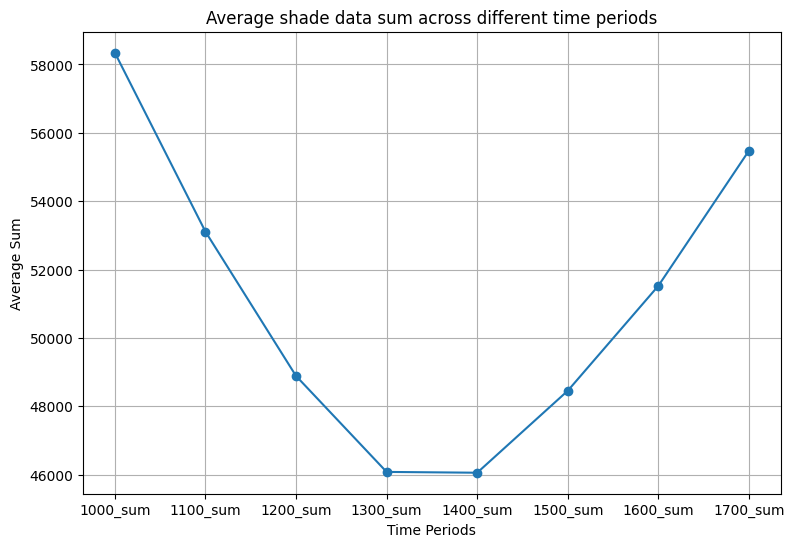

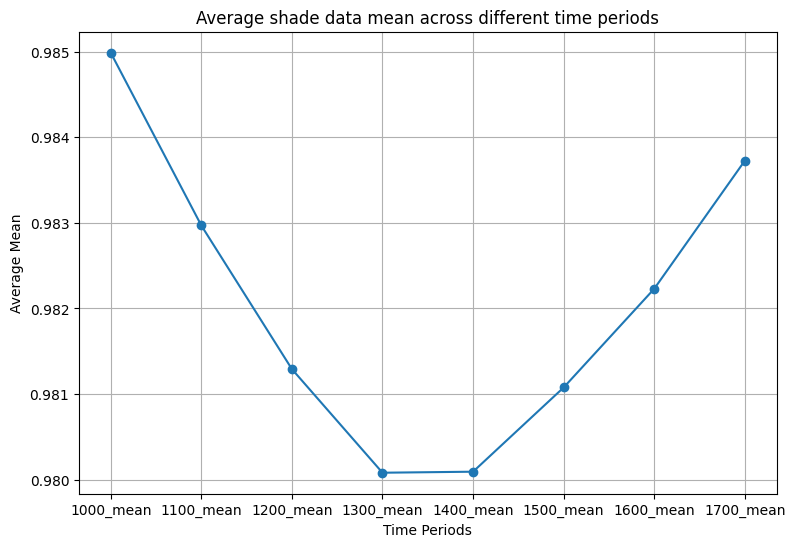

In [ ]:
sum_means = shade_data[sum_cols].mean()
mean_means = shade_data[mean_cols].mean()

#sum
plt.figure(figsize=(9, 6))  # Adjust figure size as needed
plt.plot(sum_means.index, sum_means.values, marker='o')
plt.title('Average shade data sum across different time periods')
plt.xlabel('Time Periods')
plt.ylabel('Average Sum')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.grid(True)  # Add grid for better readability
plt.show()

#mean
plt.figure(figsize=(9, 6))  # Adjust figure size as needed
plt.plot(mean_means.index, mean_means.values, marker='o')
plt.title('Average shade data mean across different time periods')
plt.xlabel('Time Periods')
plt.ylabel('Average Mean')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.grid(True)  # Add grid for better readability
plt.show()

In [ ]:
social_data = data2023
merged_data = pd.merge(social_data, shade_data, on='Code', how='inner')

# Calculate the total number of missing values in each column of merged_data
missing_values = merged_data.isna().sum()

# Use the to_string() method to print the complete results
#print(missing_values.to_string(max_rows=None))

# Filter out columns with less than 10 missing values
no_missing_columns = missing_values[missing_values < 90].index

# Print the names of these columns line by line, enclosed in double quotes
for column in no_missing_columns: print(f'"{column}"')

"Neighbourh"
"City"
"District"
"Code"
"Regional designation | Coding"
"Shape_Leng"
"Shape_Area"
"geometry"
"Subject"
"Regional designation | Municipal name"
"Regional designation | Type of region"
"Regional designation | Change of Change, Wijk, Neighborhood change"
"Population | Number of inhabitants"
"Population | Gender | Men"
"Population | Gender | Women"
"Population | Age groups | 0 to 15 years"
"Population | Age groups | 15 to 25 years"
"Population | Age groups | 25 to 45 years"
"Population | Age groups | 45 to 65 years"
"Population | Age groups | 65 years or older"
"Population | Civil status | Unmarried"
"Population | Civil status | Married"
"Population | Civil status | Separate"
"Population | Civil status | Dwarded"
"Population | Population according to origin | origin country | The Netherlands"
"Population | Population according to origin | Orches of origin | Europe (excluding the Netherlands)"
"Population | Population according to origin | origin country | outside Europe"
"Pop

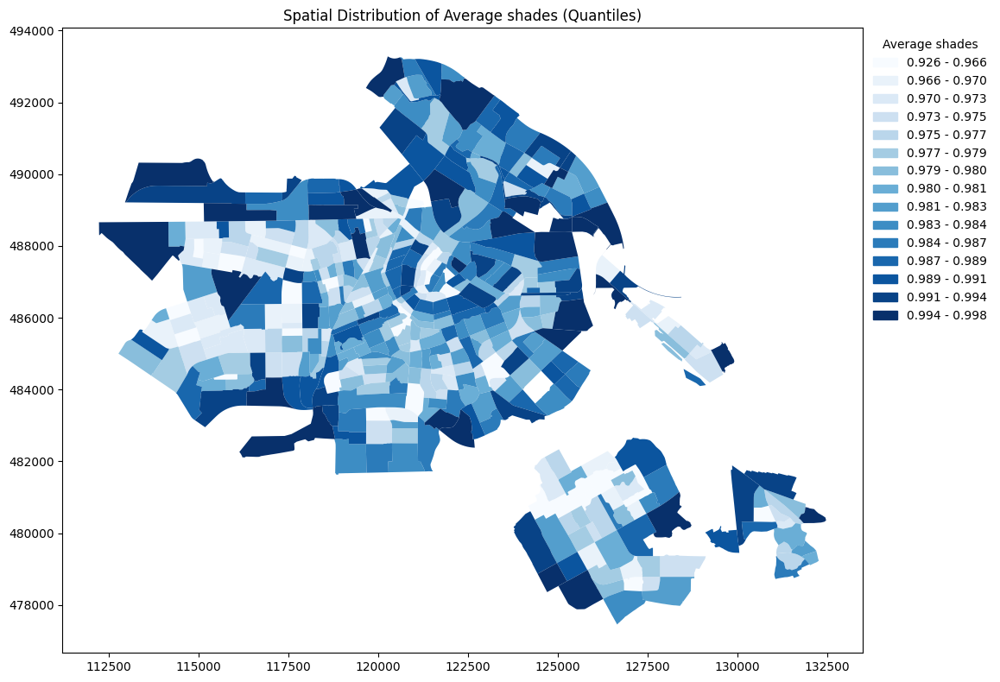

In [ ]:
import geopandas as gpd
import mapclassify
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

geo_merged_data = gpd.GeoDataFrame(merged_data, geometry=merged_data.geometry)

classifier = mapclassify.Quantiles(geo_merged_data['Average shades'], k=15)
geo_merged_data['class'] = classifier.yb
cmap = plt.cm.Blues
colors = [cmap(i / 14) for i in range(15)]

fig, ax = plt.subplots(1, 1, figsize=(16, 8))
for i in range(15):
    subset = geo_merged_data[geo_merged_data['class'] == i]
    subset.plot(ax=ax, color=colors[i])

ax.set_title('Spatial Distribution of Average shades (Quantiles)')

bins = classifier.bins
lower_bounds = [geo_merged_data['Average shades'].min()] + list(bins[:-1])
upper_bounds = bins

handles = [
    mpatches.Patch(color=colors[i],
                   label=f'{lower_bounds[i]:.3f} - {upper_bounds[i]:.3f}')
    for i in range(15)
]

legend = ax.legend(handles=handles, title='Average shades', loc='upper left', bbox_to_anchor=(1, 1))
legend.get_frame().set_linewidth(0)
legend.get_frame().set_facecolor('none')

plt.tight_layout()
plt.show()

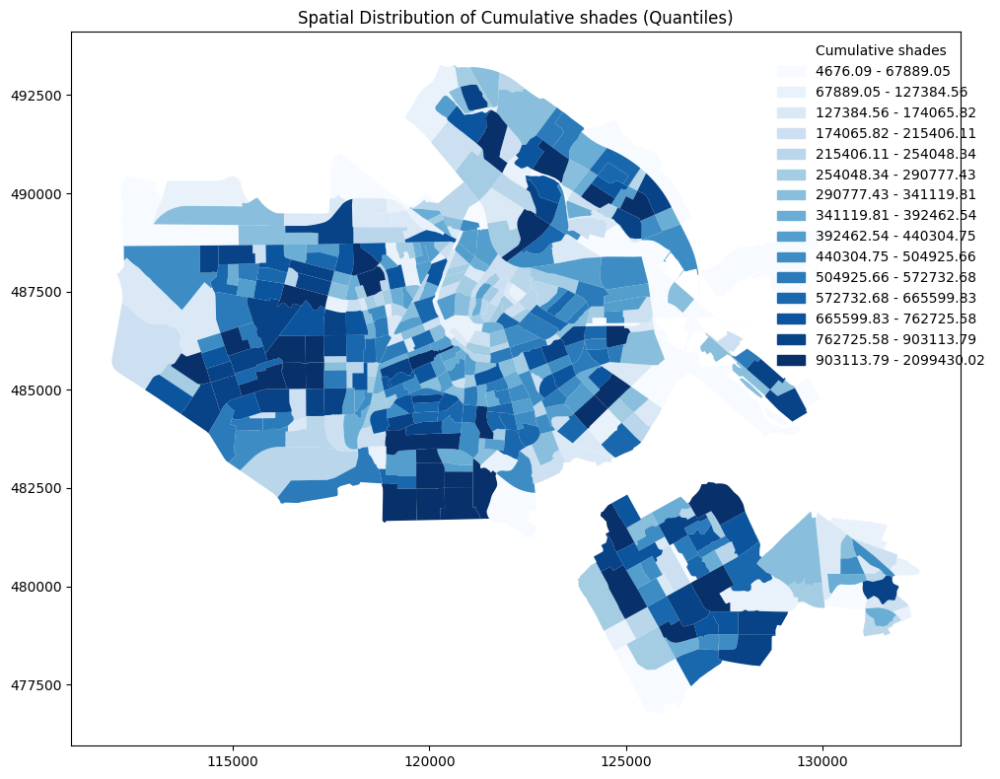

In [ ]:
geo_merged_data = gpd.GeoDataFrame(merged_data, geometry=merged_data.geometry)

classifier = mapclassify.Quantiles(geo_merged_data['Cumulative shades'], k=15)
geo_merged_data['class'] = classifier.yb
cmap = plt.cm.Blues
colors = [cmap(i / 14) for i in range(15)]

fig, ax = plt.subplots(1, 1, figsize=(16, 8))
for i in range(15):
    subset = geo_merged_data[geo_merged_data['class'] == i]
    subset.plot(ax=ax, color=colors[i])

ax.set_title('Spatial Distribution of Cumulative shades (Quantiles)')

bins = classifier.bins
lower_bounds = [geo_merged_data['Cumulative shades'].min()] + list(bins[:-1])
upper_bounds = bins

handles = [
    mpatches.Patch(color=colors[i],
                   label=f'{lower_bounds[i]:.2f} - {upper_bounds[i]:.2f}')
    for i in range(15)
]

legend = ax.legend(handles=handles, title='Cumulative shades', loc='upper left', bbox_to_anchor=(0.78, 1))
legend.get_frame().set_linewidth(0)
legend.get_frame().set_facecolor('none')

plt.tight_layout()
plt.show()

Gini coefficient

In [ ]:
import numpy as np
from scipy import stats


socioeconomic_indicators = [
"Population | Number of inhabitants",
"Population | Gender | Men",
"Population | Gender | Women",
"Population | Age groups | 0 to 15 years",
"Population | Age groups | 15 to 25 years",
"Population | Age groups | 25 to 45 years",
"Population | Age groups | 45 to 65 years",
"Population | Age groups | 65 years or older",
"Population | Population according to origin | origin country | The Netherlands",
"Population | Population according to origin | Orches of origin | Europe (excluding the Netherlands)",
"Population | Population according to origin | origin country | outside Europe",
"Population | Private households | Households Total",
"Population | Private households | Single -person households",
"Population | Private households | Households without children",
"Population | Private households | Households with children",
"Population | Private households | Average household size",
"Population | Population density",
"Living | Housing stock",
"Living | Average WOZ value of homes",
"Living | Houses to habitation | Percentage inhabited",
"Living | Houses to habitation | percentage uninhabited",
"Living | Houses to year of construction | Year of construction for 2000",
"Living | Houses to year of construction | Year of construction from 2000",
"Income | Income of people | Number of income recipients",
"Income | Income of people | 40% people with lowest income",
"Income | Income of people | 20% people with highest income",
"Income | Household income | 40% households with lowest income",
"Income | Household income | 20% households with highest income",
"Social Security | Persons per type of benefit",
"Business locations, SBI 2008 | Commercial sites Total",
"Motor vehicles | Passenger cars | Passenger cars Total",
"Motor vehicles | Motorcycles",
"Proximity facilities | Distance to general practice",
"Proximity facilities | Distance to large supermarket",
"Proximity facilities | Distance to daycare center",
"Proximity facilities | Primary education | Distance to school",
"Proximity facilities | Primary education | Schools within 3 km",
"Surface | Surface Land",
"Surface | Surface Water",
"Urbanity | degree of urbanity",
"Urbanity | Environmental address density"
]

# Convert columns to numeric, handling errors
socioeconomic_df = merged_data[socioeconomic_indicators + ['Cumulative shades'] + ['Average shades']].apply(pd.to_numeric, errors='coerce')

def remove_outliers_and_nan(data, column):
    mean = data[column].mean()
    std = data[column].std()

    threshold = 100 * std

    outliers = data[(data[column] - mean).abs() > threshold]

    data = data.drop(outliers.index)
    data = data.dropna(subset=[column])

    return data

for column in socioeconomic_df:
    socioeconomic_df = remove_outliers_and_nan(socioeconomic_df, column)

socioeconomic_df[socioeconomic_indicators] = socioeconomic_df[socioeconomic_indicators].fillna(socioeconomic_df[socioeconomic_indicators].mean())
socioeconomic_df

,Population | Number of inhabitants,Population | Gender | Men,Population | Gender | Women,Population | Age groups | 0 to 15 years,Population | Age groups | 15 to 25 years,Population | Age groups | 25 to 45 years,Population | Age groups | 45 to 65 years,Population | Age groups | 65 years or older,Population | Population according to origin | origin country | The Netherlands,Population | Population according to origin | Orches of origin | Europe (excluding the Netherlands),...,Proximity facilities | Distance to large supermarket,Proximity facilities | Distance to daycare center,Proximity facilities | Primary education | Distance to school,Proximity facilities | Primary education | Schools within 3 km,Surface | Surface Land,Surface | Surface Water,Urbanity | degree of urbanity,Urbanity | Environmental address density,Cumulative shades,Average shades
0,345,180,160,15,25,180,90,35,160,90,...,0.3,0.1,0.5,15.7,2,1,1.0,8723.0,81492.141591,0.968873
1,2910,1395,1520,290,260,910,870,585,1600,570,...,0.6,0.3,0.4,14.3,15,6,1.0,7797.0,418914.750540,0.985242
2,1825,925,900,210,140,515,550,410,880,335,...,0.7,0.2,1.0,14.7,16,18,1.0,6823.0,393166.838571,0.981746
3,165,85,80,10,10,65,55,30,90,30,...,0.2,0.3,0.7,20.0,1,0,1.0,8984.0,43391.935529,0.969133
4,2375,1210,1170,190,240,810,685,445,1220,465,...,0.2,0.5,0.7,16.1,11,1,1.0,9613.0,397582.338278,0.970228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461,2520,1250,1270,425,260,670,620,550,940,220,...,1.0,0.7,0.8,9.9,58,5,2.0,2145.0,605166.873838,0.983046
462,3005,1465,1545,470,405,875,770,490,725,305,...,0.9,0.9,0.9,11.3,31,1,2.0,2460.0,685123.882943,0.977678
463,1655,795,855,275,225,525,450,175,285,130,...,0.9,0.8,0.7,7.6,17,1,1.0,2585.0,447824.865060,0.973565
464,3195,1640,1555,425,385,710,925,755,1610,350,...,1.2,0.6,0.6,7.3,63,1,2.0,1580.0,797187.381446,0.975044


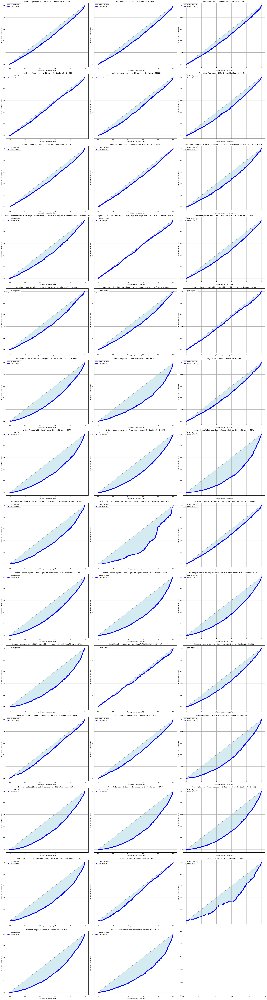

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def calculate_gini_from_df(df, population_col, ugs_col):

    population = df[population_col].values
    ugs_area = df[ugs_col].values

    sorted_indices = np.argsort(ugs_area)
    sorted_population = population[sorted_indices]
    sorted_ugs_area = ugs_area[sorted_indices]

    cumulative_population = np.cumsum(sorted_population) / np.sum(population)
    cumulative_ugs = np.cumsum(sorted_ugs_area) / np.sum(ugs_area)

    # Calculate Gini
    gini = 1 - np.sum((cumulative_population[1:] - cumulative_population[:-1]) *
                       (cumulative_ugs[1:] + cumulative_ugs[:-1]))

    return gini, cumulative_population, cumulative_ugs

# subplot
num_indicators = len(socioeconomic_indicators)
num_cols = 3
num_rows = int(np.ceil(num_indicators / num_cols))

# figure 和 axes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 8 * num_rows))

# Loop for each indicator
for i, indicator in enumerate(socioeconomic_indicators):

    # Calculation of Gini coefficient and Lorenz curve data
    gini, cumulative_population, cumulative_ugs = calculate_gini_from_df(
        socioeconomic_df, indicator, 'Cumulative shades'
    )

    # subplot's axes
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Plotting the Lorentz curve
    ax.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Perfect Equality")
    ax.plot(cumulative_population, cumulative_ugs, marker="o", color="blue", label="Lorenz Curve")
    ax.fill_between(cumulative_population, cumulative_ugs, cumulative_population, color="lightblue", alpha=0.5)

    # title and sticks
    ax.set_xlabel("Cumulative Population Share")
    ax.set_ylabel("Cumulative Shade Share")
    ax.set_title(f"{indicator} (Gini Coefficient = {gini:.4f})")
    ax.legend()
    ax.grid()

# adjust subplot layout
plt.tight_layout()
plt.show()

In [ ]:
gini_results = []
for indicator in socioeconomic_indicators:
    gini, _, _ = calculate_gini_from_df(
        socioeconomic_df, indicator, 'Cumulative shades'
    )
    gini_results.append({'indicator': indicator, 'gini_coefficient': gini})

gini_df = pd.DataFrame(gini_results)

print(gini_df)

                                            indicator  gini_coefficient
0                  Population | Number of inhabitants          0.118950
1                           Population | Gender | Men          0.122082
2                         Population | Gender | Women          0.116007
3             Population | Age groups | 0 to 15 years          0.061138
4            Population | Age groups | 15 to 25 years          0.132466
5            Population | Age groups | 25 to 45 years          0.152445
6            Population | Age groups | 45 to 65 years          0.116656
7         Population | Age groups | 65 years or older          0.077282
8   Population | Population according to origin | ...          0.175732
9   Population | Population according to origin | ...          0.176022
10  Population | Population according to origin | ...          0.042116
11  Population | Private households | Households T...          0.145625
12  Population | Private households | Single -pers...          0

Correlation analysis

In [ ]:
correlations = socioeconomic_df.corr()['Average shades']

# Sort correlations in descending order and select top
top_correlations = correlations.sort_values(ascending=False).head(36)

print(top_correlations)

Average shades                                                                                         1.000000
Surface | Surface Water                                                                                0.288405
Proximity facilities | Distance to large supermarket                                                   0.264820
Proximity facilities | Distance to general practice                                                    0.255233
Income | Household income | 20% households with highest income                                         0.245949
Surface | Surface Land                                                                                 0.234884
Income | Income of people | 20% people with highest income                                             0.233482
Urbanity | degree of urbanity                                                                          0.221631
Living | Average WOZ value of homes                                                                    0

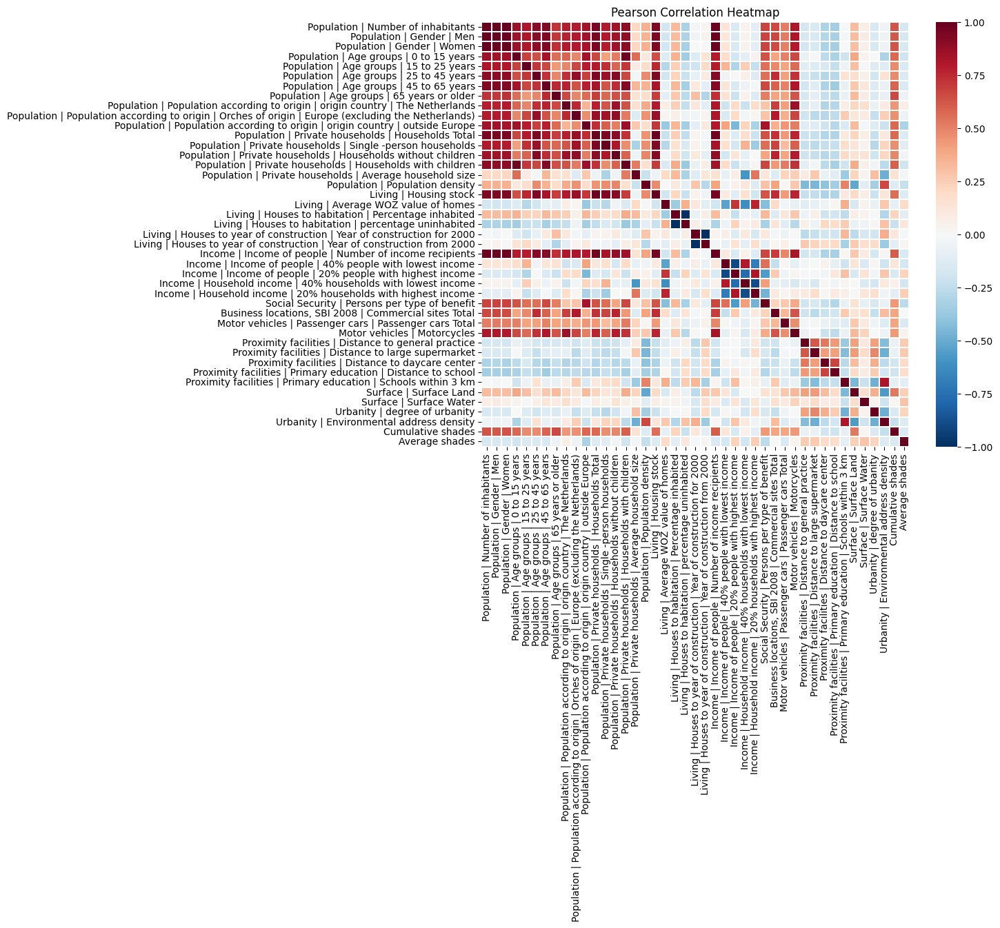

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

#heatmap
correlation_matrix = socioeconomic_df.corr()
plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=False, cmap='RdBu_r', fmt=".2f", linewidths=.1)

plt.title('Pearson Correlation Heatmap')
plt.show()

In [ ]:
# Perform linear regression for each indicator against shade_mean
from scipy import stats

results = []
for indicator in socioeconomic_indicators:
    slope, intercept, r_value, p_value, std_err = stats.linregress(
        socioeconomic_df[indicator], socioeconomic_df['Average shades']
    )
    results.append({
        'indicator': indicator,
        'r_squared': r_value**2,
        'p_value': p_value
    })

# Create a DataFrame from the results and sort by R-squared
results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by=['r_squared'], ascending=False)

# Print the top correlations
print(results_df.head(16))

                                            indicator  r_squared       p_value
10  Population | Population according to origin | ...   0.098101  1.028701e-10
38                            Surface | Surface Water   0.083177  3.087854e-09
28      Social Security | Persons per type of benefit   0.070526  5.354374e-08
33  Proximity facilities | Distance to large super...   0.070129  5.853330e-08
32  Proximity facilities | Distance to general pra...   0.065144  1.789239e-07
27  Income | Household income | 20% households wit...   0.060491  5.062181e-07
16                    Population | Population density   0.057854  9.115342e-07
37                             Surface | Surface Land   0.055170  1.657691e-06
25  Income | Income of people | 20% people with hi...   0.054514  1.918607e-06
39                      Urbanity | degree of urbanity   0.049120  6.369258e-06
3             Population | Age groups | 0 to 15 years   0.038768  6.354538e-05
14  Population | Private households | Households w..

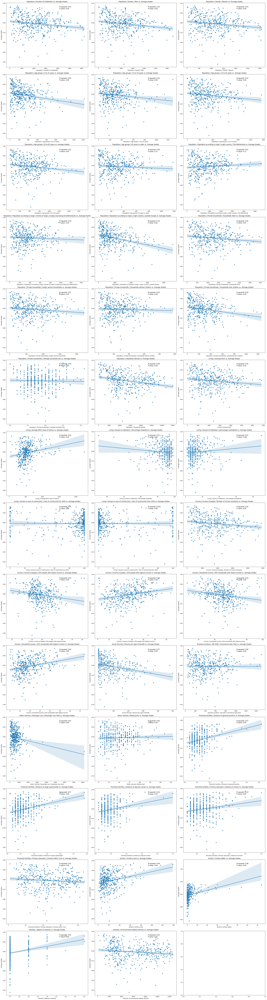

In [ ]:
# Calculate the number of rows and columns for the subplots
num_indicators = len(socioeconomic_indicators)
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_indicators / num_cols))  # Calculate number of rows

# Create a figure and an array of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 8 * num_rows))

# Iterate through indicators and plot on subplots
for i, indicator in enumerate(socioeconomic_indicators):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(socioeconomic_df[indicator], socioeconomic_df['Average shades'])

    # Create scatter plot with fitted line
    sns.regplot(x=indicator, y='Average shades', data=socioeconomic_df, ax=ax)

    # Display correlation data on the plot
    ax.text(0.65, 0.95, f"R-squared: {r_value**2:.2f}\nP-value: {p_value:.2f}", transform=ax.transAxes, verticalalignment='top', fontsize=12)

    ax.set_title(f'{indicator} vs. Average shades')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
from scipy.optimize import curve_fit

def quadratic_function(x, a, b, c):
    return a + b * x + c * x**2

results = []
for indicator in socioeconomic_indicators:
    x = socioeconomic_df[indicator].values
    y = socioeconomic_df['Average shades'].values

    # Remove inf and NaN values from x and y
    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    # Check if there are enough data points after removing inf/NaN
    if len(x) < 3:  # curve_fit needs at least 3 points for a quadratic fit
        print(f"Skipping {indicator} due to insufficient data points after removing inf/NaN.")
        continue

    # nonlinear regression
    popt, pcov = curve_fit(quadratic_function, x, y)

    a, b, c = popt

    # R-squared
    residuals = y - quadratic_function(x, a, b, c)
    ss_res = np.sum(residuals**2)
    ss_tot = np.sum((y - np.mean(y))**2)
    r_squared = 1 - (ss_res / ss_tot)

    results.append({
        'indicator': indicator,
        'r_squared': r_squared
    })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by=['r_squared'], ascending=False)


print(results_df.head(36))

                                            indicator  r_squared
16                    Population | Population density   0.218756
38                            Surface | Surface Water   0.177303
32     Proximity Facilities | Distance to GP practice   0.135875
33  Proximity facilities | Distance to large super...   0.135379
10  Population | Population according to origin | ...   0.130702
39                      Urbanity | degree of urbanity   0.123886
37                             Surface | Surface Land   0.122908
40           Urbanity | Environmental address density   0.113440
28      Social Security | Persons per type of benefit   0.111043
26  Income | Household income | 40% households wit...   0.105979
34  Proximity facilities | Distance to daycare center   0.103427
35  Proximity facilities | Primary education | Dis...   0.098290
36  Proximity facilities | Primary education | Sch...   0.093242
27  Income | Household income | 20% households wit...   0.076824
17                       

<ipython-input-68-9bae0588de7b>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(results_df, x='r_squared', y='indicator', inner='stick', palette='Dark2')


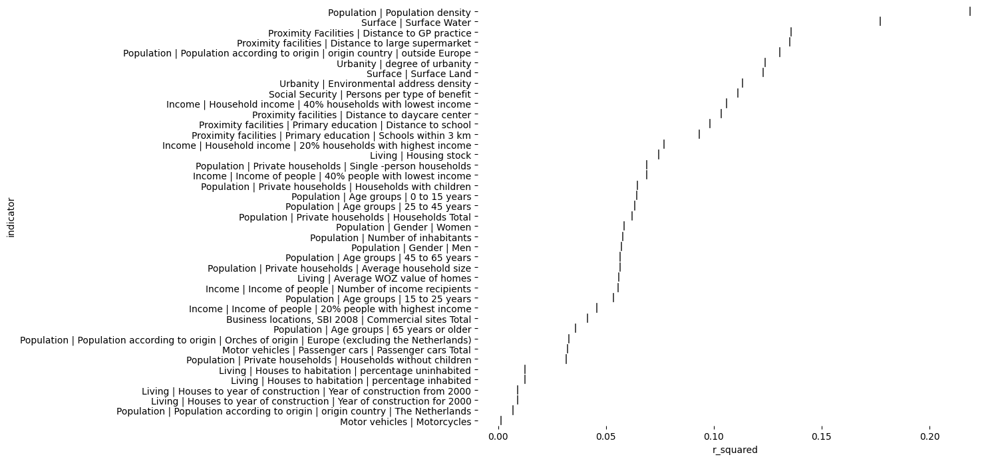

In [ ]:
# @title indicator vs r_squared

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (10, 0.2 * len(results_df['indicator'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(results_df, x='r_squared', y='indicator', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
import xgboost as xgb
from sklearn.metrics import r2_score

results = []
for indicator in socioeconomic_indicators:
    x = socioeconomic_df[[indicator]].values  # XGBoost needs 2D array for input
    y = socioeconomic_df['Average shades'].values

    # Remove inf and NaN values from x and y
    # Reshape x to be 1D for element-wise comparison
    x_1d = x.reshape(-1)
    mask = np.isfinite(x_1d) & np.isfinite(y)
    x = x[mask, :]  # Apply mask to both dimensions of x
    y = y[mask]

    # Check if there are enough data points after removing inf/NaN
    if len(x) < 3:  # XGBoost also needs sufficient data points
        print(f"Skipping {indicator} due to insufficient data points after removing inf/NaN.")
        continue

    # XGBoost model
    model = xgb.XGBRegressor()
    model.fit(x, y)

    r_squared = r2_score(y, y_pred)

    results.append({
        'indicator': indicator,
        'r_squared': r_squared
    })

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by=['r_squared'], ascending=False)

print(results_df.head(36))

                                            indicator  r_squared
16                    Population | Population density   0.686623
40           Urbanity | Environmental address density   0.649345
18                Living | Average WOZ value of homes   0.595355
36  Proximity facilities | Primary education | Sch...   0.581549
8   Population | Population according to origin | ...   0.564179
24  Income | Income of people | 40% people with lo...   0.547427
17                             Living | Housing stock   0.546946
10  Population | Population according to origin | ...   0.543342
0                  Population | Number of inhabitants   0.540053
5            Population | Age groups | 25 to 45 years   0.520225
12  Population | Private households | Single -pers...   0.508427
26  Income | Household income | 40% households wit...   0.503835
1                           Population | Gender | Men   0.501066
27  Income | Household income | 20% households wit...   0.499773
30  Motor vehicles | Pass

<ipython-input-73-9bae0588de7b>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(results_df, x='r_squared', y='indicator', inner='stick', palette='Dark2')


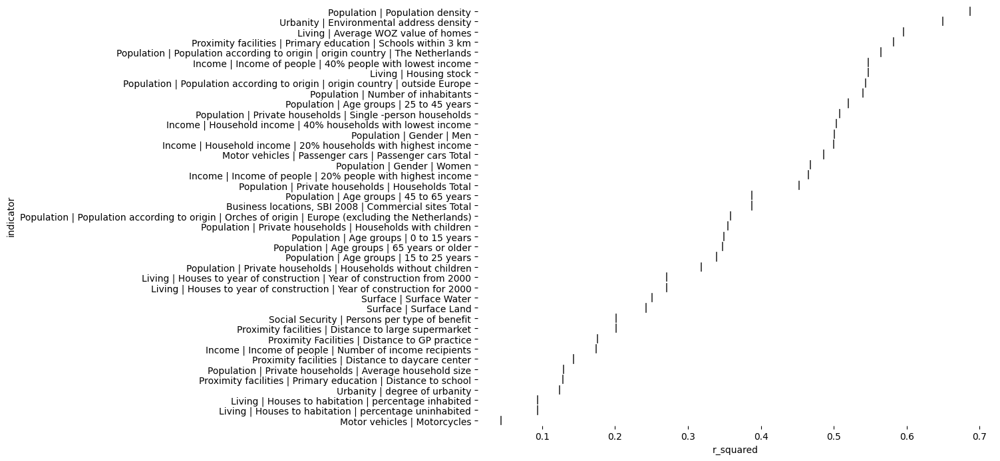

In [ ]:
# @title indicator vs r_squared

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (10, 0.2 * len(results_df['indicator'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(results_df, x='r_squared', y='indicator', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

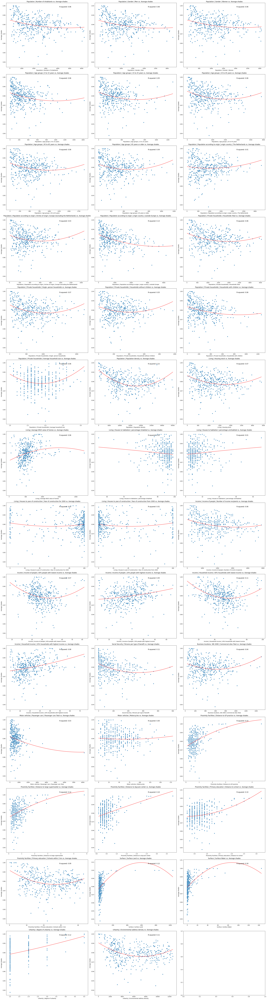

In [ ]:
def quadratic_function(x, a, b, c):
    return a + b * x + c * x**2

# Calculate the number of rows and columns for the subplots
num_indicators = len(socioeconomic_indicators)
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_indicators / num_cols))  # Calculate number of rows

# Create a figure and an array of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 8 * num_rows))

# Iterate through indicators and plot on subplots
for i, indicator in enumerate(socioeconomic_indicators):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    # Get x and y data
    x = socioeconomic_df[indicator].values
    y = socioeconomic_df['Average shades'].values

    # Remove inf and NaN values from x and y
    mask = np.isfinite(x) & np.isfinite(y)
    x = x[mask]
    y = y[mask]

    # Check for sufficient data points
    if len(x) < 3:
        print(f"Skipping {indicator} due to insufficient data points after removing inf/NaN.")
        ax.set_title(f'{indicator} vs. Average shades - Insufficient Data')
        continue

    # Perform quadratic fit
    try:
        popt, pcov = curve_fit(quadratic_function, x, y)
        a, b, c = popt

        # Calculate R-squared
        residuals = y - quadratic_function(x, a, b, c)
        ss_res = np.sum(residuals**2)
        ss_tot = np.sum((y - np.mean(y))**2)
        r_squared = 1 - (ss_res / ss_tot)

        # Create scatter plot
        sns.scatterplot(x=x, y=y, ax=ax)  # Scatter plot of original data

        # Generate x values for the fitted curve
        x_fit = np.linspace(x.min(), x.max(), 100)
        y_fit = quadratic_function(x_fit, a, b, c)

        # Plot the fitted curve
        ax.plot(x_fit, y_fit, color='red', label='Quadratic Fit')

        # Display correlation data on the plot
        ax.text(0.65, 0.95, f"R-squared: {r_squared:.2f}",
                transform=ax.transAxes, verticalalignment='top', fontsize=12)
    except (RuntimeError, ValueError) as e:
        print(f"Error fitting {indicator}: {e}")
        ax.set_title(f'{indicator} vs. Average shades - Fit Error')

    ax.set_title(f'{indicator} vs. Average shades')
    ax.set_xlabel(indicator)
    ax.set_ylabel('Average shades')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

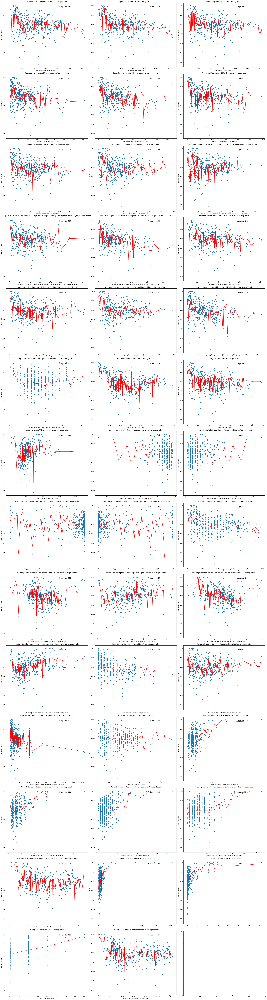

In [ ]:
# Calculate the number of rows and columns for the subplots
num_indicators = len(socioeconomic_indicators)
num_cols = 3  # Number of columns in the subplot grid
num_rows = int(np.ceil(num_indicators / num_cols))  # Calculate number of rows

# Create a figure and an array of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(30, 8 * num_rows))

# Iterate through indicators and plot on subplots
for i, indicator in enumerate(socioeconomic_indicators):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]

    x = socioeconomic_df[[indicator]].values  # XGBoost needs 2D array for input
    y = socioeconomic_df['Average shades'].values

    # Remove inf and NaN values from x and y
    # Reshape x to be 1D for element-wise comparison
    x_1d = x.reshape(-1)
    mask = np.isfinite(x_1d) & np.isfinite(y)
    x = x[mask, :]  # Apply mask to both dimensions of x
    y = y[mask]

    # Check if there are enough data points after removing inf/NaN
    if len(x) < 3:  # XGBoost also needs sufficient data points
        print(f"Skipping {indicator} due to insufficient data points after removing inf/NaN.")
        ax.set_title(f'{indicator} vs. Average shades - Insufficient Data')
        continue

    # XGBoost model
    model = xgb.XGBRegressor()
    model.fit(x, y)
    y_pred = model.predict(x)

    r_squared = r2_score(y, y_pred)

    # Create scatter plot
    ax.scatter(x, y, label='Actual Data')  # Scatter plot of original data

    # Generate x values for the fitted curve (sorted for better visualization)
    x_fit = np.sort(x[:, 0])  # Assuming x has only one feature
    x_fit = x_fit.reshape(-1, 1)  # Reshape for XGBoost prediction
    y_fit = model.predict(x_fit)

    # Plot the fitted curve
    ax.plot(x_fit, y_fit, color='red', label='XGBoost Fit')

    # Display correlation data on the plot
    ax.text(0.65, 0.95, f"R-squared: {r_squared:.2f}",
            transform=ax.transAxes, verticalalignment='top', fontsize=12)

    ax.set_title(f'{indicator} vs. Average shades')
    ax.set_xlabel(indicator)
    ax.set_ylabel('Average shades')
    #ax.legend()

# Adjust layout and display the plot
plt.tight_layout()
plt.show()